##**2. Data Preparation and Overview**

###**2.1 Attribute Information**

Given is the attribute name, attribute type, the measurement unit and a brief description. The forest cover type is the classification problem. The order of this listing corresponds to the order of numerals along the rows of the database.

**Name / Data Type / Measurement / Description**

Elevation / quantitative /meters / Elevation in meters

Aspect / quantitative / azimuth / Aspect in degrees azimuth

Slope / quantitative / degrees / Slope in degrees

Horizontal_Distance_To_Hydrology / quantitative / meters / Horz Dist to nearest surface water features

Vertical_Distance_To_Hydrology / quantitative / meters / Vert Dist to nearest surface water features

Horizontal_Distance_To_Roadways / quantitative / meters / Horz Dist to nearest roadway

Hillshade_9am / quantitative / 0 to 255 index / Hillshade index at 9am, summer solstice

Hillshade_Noon / quantitative / 0 to 255 index / Hillshade index at noon, summer soltice

Hillshade_3pm / quantitative / 0 to 255 index / Hillshade index at 3pm, summer solstice

Horizontal_Distance_To_Fire_Points / quantitative / meters / Horz Dist to nearest wildfire ignition points

Wilderness_Area (4 binary columns) / qualitative / 0 (absence) or 1 (presence) / Wilderness area designation

Soil_Type (40 binary columns) / qualitative / 0 (absence) or 1 (presence) / Soil Type designation

Cover_Type (7 types) / integer / 1 to 7 / Forest Cover Type designation

###**2.2 Importing dataset & packages**

In [ ]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from scipy.special import expit
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
%cd /content/drive/My Drive/

/content/drive/My Drive


In [ ]:
# Import data
cov_data = pd.read_csv("covtype_wcolumns.txt")
cov_data = cov_data.dropna().reset_index(drop=True)

In [ ]:
cov_data.head(10)

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39,Soil_Type_40,Cover_Type
0,2596,51,3,258,0,510,221,232,148,6279,...,0,0,0,0,0,0,0,0,0,5
1,2590,56,2,212,-6,390,220,235,151,6225,...,0,0,0,0,0,0,0,0,0,5
2,2804,139,9,268,65,3180,234,238,135,6121,...,0,0,0,0,0,0,0,0,0,2
3,2785,155,18,242,118,3090,238,238,122,6211,...,0,0,0,0,0,0,0,0,0,2
4,2595,45,2,153,-1,391,220,234,150,6172,...,0,0,0,0,0,0,0,0,0,5
5,2579,132,6,300,-15,67,230,237,140,6031,...,0,0,0,0,0,0,0,0,0,2
6,2606,45,7,270,5,633,222,225,138,6256,...,0,0,0,0,0,0,0,0,0,5
7,2605,49,4,234,7,573,222,230,144,6228,...,0,0,0,0,0,0,0,0,0,5
8,2617,45,9,240,56,666,223,221,133,6244,...,0,0,0,0,0,0,0,0,0,5
9,2612,59,10,247,11,636,228,219,124,6230,...,0,0,0,0,0,0,0,0,0,5


###**2.3 Preprocessing**

In [ ]:
print(cov_data['Cover_Type'].value_counts())

2    283301
1    211840
3     35754
7     20510
6     17367
5      9493
4      2747
Name: Cover_Type, dtype: int64


For the target variable, the available data for each class is imbalanced. Hence, before we proceed we will undersample to have similar counts of data in each class

In [ ]:
import random
import numpy as np
# create a list of unique categories
categories = cov_data['Cover_Type'].unique()
groups = [cov_data.groupby('Cover_Type').get_group(category) for category in categories]

main_sample =pd.DataFrame()
sample_size4 = int(len(cov_data[cov_data['Cover_Type']==4]['Cover_Type']))
for group_no in range(0,len(categories)):
    sample_group = groups[group_no].reset_index()
    # randomly select a proportion of the group to sample
    if sample_group['Cover_Type'][0] != 4 and len(sample_group)> int(sample_size4*15):
        sample_size = int(len(sample_group) * 0.01)
    elif  sample_group['Cover_Type'][0] != 4 and len(sample_group)> int(sample_size4*3):
        sample_size = max(sample_size4,int(len(sample_group) * 0.09))
    else:
        sample_size = int(len(sample_group))
    sample = sample_group.sample(sample_size)
    main_sample=pd.concat([main_sample,sample])
main_sample=main_sample.drop(columns=["index"]).reset_index(drop=True)
print(main_sample['Cover_Type'].value_counts())

3    3217
2    2833
5    2747
7    2747
6    2747
4    2747
1    2118
Name: Cover_Type, dtype: int64


In [ ]:
# Split feature space and target column
X = main_sample.iloc[:,0:-1]
y = main_sample.iloc[:,-1:]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2)
X_train = X_train.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

In [ ]:
for var in X.columns[10:44]:
  print(var)
  print(X[var].value_counts())


Wilderness_Area_1
0    14894
1     4262
Name: Wilderness_Area_1, dtype: int64
Wilderness_Area_2
0    18544
1      612
Name: Wilderness_Area_2, dtype: int64
Wilderness_Area_3
0    11149
1     8007
Name: Wilderness_Area_3, dtype: int64
Wilderness_Area_4
0    12881
1     6275
Name: Wilderness_Area_4, dtype: int64
Soil_Type_1
0    18696
1      460
Name: Soil_Type_1, dtype: int64
Soil_Type_2
0    18283
1      873
Name: Soil_Type_2, dtype: int64
Soil_Type_3
0    17880
1     1276
Name: Soil_Type_3, dtype: int64
Soil_Type_4
0    18021
1     1135
Name: Soil_Type_4, dtype: int64
Soil_Type_5
0    18932
1      224
Name: Soil_Type_5, dtype: int64
Soil_Type_6
0    18274
1      882
Name: Soil_Type_6, dtype: int64
Soil_Type_7
0    19156
Name: Soil_Type_7, dtype: int64
Soil_Type_8
0    19156
Name: Soil_Type_8, dtype: int64
Soil_Type_9
0    19144
1       12
Name: Soil_Type_9, dtype: int64
Soil_Type_10
0    16275
1     2881
Name: Soil_Type_10, dtype: int64
Soil_Type_11
0    18605
1      551
Name: Soil_Ty

The value counts for the soil types and Wilderness are imbalanced. Hence we will use pca to convert 44 columns to pca features and then join them back to the dataset

In [ ]:
from sklearn.decomposition import PCA
n_components= 15
pca = PCA(n_components=n_components)
pca_comp = pca.fit_transform(X_train.iloc[:,10:])
pca_df = pd.DataFrame(pca_comp,columns = ['PCA_'+str(i) for i in range(0,n_components)])


Explained variance ratio: [0.24766855 0.19345631 0.07308002 0.04064794 0.03725982 0.03538041
 0.03126454 0.0281862  0.02786878 0.02725489 0.0271226  0.02547915
 0.02451913 0.02186836 0.01995478]
Total Explained variance ratio: 0.8610114945333947


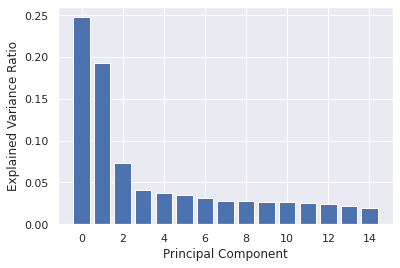

In [ ]:
print("Explained variance ratio:", pca.explained_variance_ratio_)
print("Total Explained variance ratio:", sum(pca.explained_variance_ratio_))
# Plot the explained variance ratio
plt.bar(range(n_components), pca.explained_variance_ratio_)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.show()

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
# init a classifier for each feature space
knn_pca = KNeighborsClassifier(n_neighbors=1)

# separate the data into train/test
pca_train, pca_test, pca_y_train, pca_y_test = train_test_split(
    pca_df, y_train, train_size=0.9,random_state=112)

# fit each classifier
knn_pca.fit(pca_train,pca_y_train)
acc_pca = accuracy_score(knn_pca.predict(pca_test),pca_y_test)


# report accuracy
print(f"PCA accuracy:{100*acc_pca:.2f}%".format())

PCA accuracy:56.23%


The 15 pca components explains 86% of variance of the 44 features.And it also explains around 50% of the target variable

In [ ]:
X_train_mod = X_train.iloc[:,:10].join(pca_df)
pca_df = pd.DataFrame(pca.fit_transform(X_test.iloc[:,10:]),columns = ['PCA_'+str(i) for i in range(0,n_components)])
X_test_mod = X_test.iloc[:,:10].join(pca_df)
X_test_mod
X_train_mod.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15324 entries, 0 to 15323
Data columns (total 25 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Elevation                           15324 non-null  int64  
 1   Aspect                              15324 non-null  int64  
 2   Slope                               15324 non-null  int64  
 3   Horizontal_Distance_To_Hydrology    15324 non-null  int64  
 4   Vertical_Distance_To_Hydrology      15324 non-null  int64  
 5   Horizontal_Distance_To_Roadways     15324 non-null  int64  
 6   Hillshade_9am                       15324 non-null  int64  
 7   Hillshade_Noon                      15324 non-null  int64  
 8   Hillshade_3pm                       15324 non-null  int64  
 9   Horizontal_Distance_To_Fire_Points  15324 non-null  int64  
 10  PCA_0                               15324 non-null  float64
 11  PCA_1                               15324

Scaled the quantitative features with MinMaxScalar.

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# create a scaler object
scaler = MinMaxScaler()
# fit and transform the data
X_train_sample = pd.DataFrame(scaler.fit_transform(X_train.iloc[:,:10]),columns =X_train.iloc[:,:10].columns)
X_train_sample =X_train_sample.join(X_train_mod.iloc[:,10:])
X_test_sample = pd.DataFrame(scaler.fit_transform(X_test.iloc[:,:10]),columns =X_test.iloc[:,:10].columns)
X_test_sample = X_test_sample.join(X_test_mod.iloc[:,10:])
X_test_sample


,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,PCA_11,PCA_12,PCA_13,PCA_14
0,0.725065,0.000000,0.254902,0.382239,0.400763,0.415455,0.693642,0.761006,0.610442,0.492152,...,-0.006784,-0.203437,0.025944,0.156220,-0.546886,-0.425913,0.334966,0.303955,-0.261683,0.013570
1,0.500775,0.547222,0.333333,0.227799,0.276718,0.149214,0.763006,0.987421,0.674699,0.267273,...,0.003812,-0.122279,0.027210,0.031353,-0.073636,-0.031621,-0.178237,-0.226298,0.571688,0.368272
2,0.702326,0.991667,0.352941,0.278764,0.500000,0.560664,0.618497,0.679245,0.602410,0.523691,...,-0.018816,0.065560,-0.047845,0.007375,-0.002534,-0.004651,0.087431,0.083102,0.403853,-0.101808
3,0.403101,0.125000,0.117647,0.186873,0.293893,0.037526,0.815029,0.830189,0.562249,0.144345,...,-0.009915,-0.088145,0.018376,0.033819,-0.034817,-0.016911,-0.056123,-0.144680,0.178197,0.306873
4,0.232558,0.919444,0.470588,0.051737,0.297710,0.191338,0.445087,0.679245,0.726908,0.035499,...,0.009320,0.018851,-0.003457,-0.006594,0.006202,0.003100,0.012780,0.018389,-0.019514,0.007366
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3827,0.257364,0.316667,0.196078,0.023166,0.272901,0.125334,0.907514,0.849057,0.489960,0.146545,...,-0.633081,-0.122681,0.012273,-0.238150,-0.227566,-0.057710,-0.330875,0.055596,0.073511,-0.195900
3828,0.472351,0.830556,0.294118,0.393822,0.351145,0.281222,0.560694,0.867925,0.783133,0.290450,...,-0.056132,-0.099451,0.021865,0.111018,0.035265,0.001187,0.454276,-0.722021,0.055883,-0.421992
3829,0.522997,0.283333,0.450980,0.437066,0.045802,0.086325,0.982659,0.679245,0.269076,0.254657,...,0.078246,-0.352671,0.143818,-0.024208,-0.052515,0.036431,0.027864,0.008366,0.075824,-0.013446
3830,0.395349,0.397222,0.392157,0.148263,0.318702,0.465441,0.942197,0.855346,0.429719,0.277541,...,0.003812,-0.122279,0.027210,0.031353,-0.073636,-0.031621,-0.178237,-0.226298,0.571688,0.368272


From the heatmap below, we do not observe any multicolinearity

<AxesSubplot:>

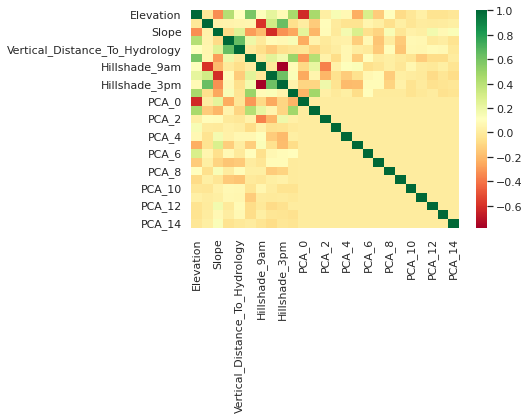

In [ ]:
sns.heatmap(X_train_sample.corr(),cmap="RdYlGn")

In [ ]:
pp=X_train_sample.join(y_train)

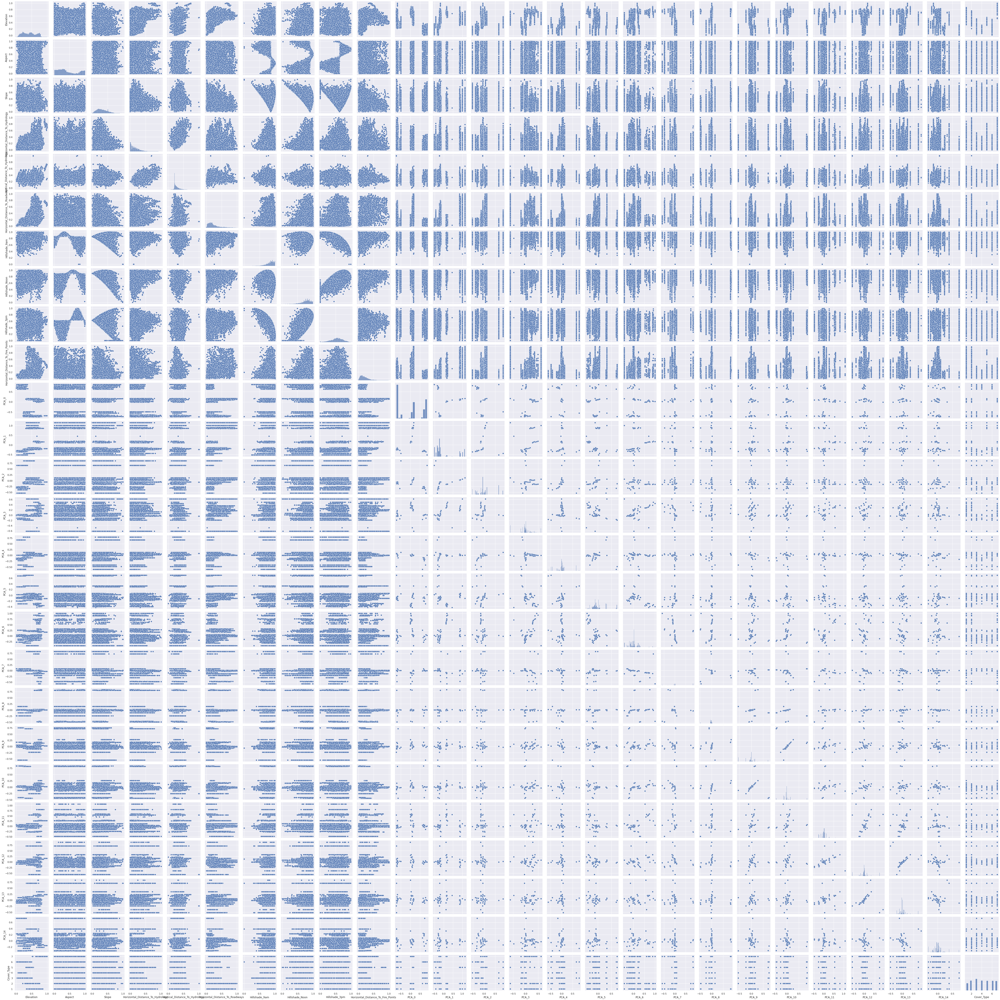

In [ ]:
sns.pairplot(pp)

From the pairplot, we can observe that there are features that do not show any positive or negative impact. There are features like slope that shows an negative impact on the Hillshade feature with respect to 9am, Noon and 3pm. The relation among these three features is hyperbolic, indicating that beyond a threshold their relation changes direction. Thus these features seem important to be considered.

Since we do not have any evidence to drop the column we will use all of them to determine the forest cover type as there can be a probability that they are significant in determining an algorithm to find the quality.

Also since we will be using the L1 and L2 regularization, the features that do not add value will be penalized. Hence we will not be dropping any of the columns

In [ ]:
y_train_sample=y_train["Cover_Type"]
y_test_sample=y_test["Cover_Type"]

In [ ]:
X_train_sample.shape

(15324, 25)

X_train_sample and X_test_sample will be the dataset available

**Argue "for" or "against" splitting your data using an 80/20 split. That is, why is the 80/20 split appropriate (or not) for your dataset?**

There are two competing concerns: with less training data, our parameter estimates have greater variance. With less testing data, our performance statistic will have greater variance. Broadly speaking we should be concerned with dividing data such that neither variance is too high, which is more to do with the absolute number of instances in each category rather than the percentage.

If we have a total of 100 instances, we are probably stuck with cross validation as no single split is going to give us satisfactory variance in our estimates. If we have 100,000 instances, it doesn't really matter whether we choose an 80:20 split or a 90:10 split (indeed we may choose to use less training data if your method is particularly computationally intensive).

So in the case of our dataset we can see that we have 15324 Rows we don't need to be concerned about a split ration as we have a huge quantity of data. we can even consider going for a 90/10 split or even 70/30 split but as there are no limitations to us we can stick to 80/20 rule for our analysis.

###**2.4 Summarizing the Variables**

**Provide a breakdown of the variables after preprocessing (such as the mean, std, etc. for all variables, including numeric and categorical).**

In [ ]:
X_train_sample.describe()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,PCA_11,PCA_12,PCA_13,PCA_14
count,15324.000000,15324.000000,15324.000000,15324.000000,15324.000000,15324.000000,15324.000000,15324.000000,15324.000000,15324.000000,...,1.532400e+04,1.532400e+04,1.532400e+04,1.532400e+04,1.532400e+04,1.532400e+04,1.532400e+04,1.532400e+04,1.532400e+04,1.532400e+04
mean,0.428657,0.437421,0.310707,0.172019,0.279051,0.234024,0.836013,0.775909,0.541362,0.218755,...,1.669247e-17,3.477598e-19,1.761983e-17,3.013918e-18,-5.323622e-17,-1.611287e-17,6.479923e-17,-3.118246e-17,-3.767397e-17,6.027836e-18
std,0.211034,0.305255,0.159918,0.158475,0.093702,0.182882,0.123542,0.147051,0.187425,0.159882,...,2.382769e-01,2.263577e-01,2.169863e-01,2.111280e-01,2.075023e-01,2.033542e-01,2.031356e-01,1.989550e-01,1.886970e-01,1.756447e-01
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-5.320760e-01,-3.469693e-01,-5.813782e-01,-3.728343e-01,-6.007134e-01,-4.408346e-01,-3.517609e-01,-6.530390e-01,-4.539494e-01,-4.895920e-01
25%,0.241519,0.183333,0.185185,0.050452,0.207634,0.102784,0.767717,0.696203,0.425703,0.105494,...,-9.743497e-02,-1.411491e-01,-2.977271e-02,-7.021436e-02,-3.052781e-02,-4.087187e-02,-6.171243e-02,-1.448836e-02,-4.377597e-02,-9.113462e-02
50%,0.427342,0.352778,0.296296,0.135542,0.250382,0.180259,0.866142,0.797468,0.554217,0.183080,...,-4.200299e-02,-1.522512e-02,-1.104978e-03,-1.126771e-02,1.236864e-02,4.534318e-03,-2.388815e-03,7.646302e-04,-1.140380e-02,-1.991894e-02
75%,0.601013,0.727778,0.425926,0.248494,0.322137,0.308633,0.929134,0.879747,0.670683,0.286967,...,2.238014e-02,2.845320e-02,1.777468e-02,1.943428e-02,4.584327e-02,2.591955e-02,2.248037e-02,6.132099e-03,3.835794e-02,7.356007e-02
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,5.890442e-01,1.109159e+00,1.012427e+00,8.256777e-01,9.760323e-01,9.580427e-01,8.900897e-01,9.582112e-01,9.256193e-01,5.007450e-01


##**3. Modeling**

For the modeling component, a custom, one-versus-all logistic regression classifier implementation is compared to the SkLearn logistic regression implementation.

###**3.1 Custom Logistic Regression Classifier**

The implementation for the custom logisitic regression classifier was adapted to allow for the ability to choose an optimization technique, with a choice between steepest ascent and stochastic gradient ascent. Adaptations also include the ability to choose from four regularization terms: no regularization, L1 regularization, L2 regularization, and Elastic Net regularization.

The custom implementation was borrowed from Dr. Eric Larson's course notebooks on logistic regression and optimization:
+ Source: https://github.com/eclarson/MachineLearningNotebooks/blob/master/05.%20Logistic%20Regression.ipynb
+ Source: https://github.com/eclarson/MachineLearningNotebooks/blob/master/06.%20Optimization.ipynb

With regularization adaptations inspired by:
+ Source: https://towardsdatascience.com/intuitions-on-l1-and-l2-regularisation-235f2db4c261

Below is a summary of the mathematics behind the implementation of the regularization modifications.

#### **No Regularization**
Objective Function: $$ l(\mathbf{w})_{prev} = \frac{1}{M}\cdot\sum_i \left( y^{(i)} \ln [g(\mathbf{w}^T \mathbf{x}^{(i)})] + (1-y^{(i)}) (\ln [1 - g(\mathbf{w}^T \mathbf{x}^{(i)})])  \right)  $$

Weight Update formula: $$ w_j \leftarrow w_j + \eta \nabla l(\mathbf{w}) $$

#### **L2 Regularization**:

Objective Function: $$ l(\mathbf{w})_{reg} = l(\mathbf{w})_{prev} - C\cdot\sum_j w_j^2 $$

Update Term (subtracted from weight update formula): $$\frac{\partial f}{\partial w_j} [C\cdot\sum_j w_j^2]  = 2 \cdot C \cdot w_j $$

#### **L1 Regularization**:

Objective Function: $$ l(\mathbf{w})_{reg} = l(\mathbf{w})_{prev} - C\cdot\sum_j |w_j| $$

Update Term (subtracted from weight update formula): $$\frac{\partial f}{\partial w_j} [C\cdot\sum_j |w_j|]  = C\cdot \text{sign}(w_j) $$

#### **Elastic Net Regularization**:

Objective Function: $$ l(\mathbf{w})_{reg} = l(\mathbf{w})_{prev} - C\cdot((1-\alpha)\dot\sum_j w_j^2 + \alpha\cdot\sum_j |w_j|) $$

Update Term (subtracted from weight update formula): $$\frac{\partial f}{\partial w_j} [C\cdot((1-\alpha)\dot\sum_j w_j^2 + \alpha\cdot\sum_j |w_j|]  =
C\cdot[2\cdot(1-\alpha)\cdot w_j + \alpha\cdot \text{sign}(w_j) ] $$

In [ ]:
class BinaryLogisticRegression:
    def __init__(self, eta, iterations=20, penalty='none',C=0.001, alpha=0.05):
        self.eta = eta
        self.iters = iterations
        self.penalty = penalty
        self.C = C
        self.alpha = alpha
        # internally we will store the weights as self.w_ to keep with sklearn conventions

    def __str__(self):
        if(hasattr(self,'w_')):
            return 'Binary Logistic Regression Object with coefficients:\n'+ str(self.w_) # is we have trained the object
        else:
            return 'Untrained Binary Logistic Regression Object'

    # convenience, private:
    @staticmethod
    def _add_bias(X):
        return np.hstack((np.ones((X.shape[0],1)),X)) # add bias term

    @staticmethod
    def _sigmoid(theta):
        # increase stability, redefine sigmoid operation
        return expit(theta) #1/(1+np.exp(-theta))

    # vectorized gradient calculation with regularization using L2 Norm
    def _get_gradient(self,X,y):
        ydiff = y-self.predict_proba(X,add_bias=False).ravel() # get y difference
        gradient = np.mean(X * ydiff[:,np.newaxis], axis=0) # make ydiff a column vector and multiply through

        gradient = gradient.reshape(self.w_.shape)

        if(self.penalty == 'l1'):
            gradient[1:] += -self.C * self.w_[1:] / abs(self.w_[1:])
        elif(self.penalty == 'l2'):
            gradient[1:] += -2 * self.w_[1:] * self.C
        elif(self.penalty == 'elastic_net'):
            gradient[1:] += -self.C * ((1-self.alpha)*2*self.w_[1:] + self.alpha*np.sign(self.w_[1:]))

        return gradient

    # public:
    def predict_proba(self,X,add_bias=True):
        # add bias term if requested
        Xb = self._add_bias(X) if add_bias else X
        return self._sigmoid(Xb @ self.w_) # return the probability y=1

    def predict(self,X):
        return (self.predict_proba(X)>0.5) #return the actual prediction


    def fit(self, X, y):
        Xb = self._add_bias(X) # add bias term
        num_samples, num_features = Xb.shape

        self.w_ = np.zeros((num_features,1)) # init weight vector to zeros

        # for as many as the max iterations
        for _ in range(self.iters):
            gradient = self._get_gradient(Xb,y)
            self.w_ += gradient*self.eta # multiply by learning rate
            # add bacause maximizing


In [ ]:
# Stochastic Gradient Ascent
class StochasticLogisticRegression(BinaryLogisticRegression):
    # stochastic gradient calculation
    def _get_gradient(self,X,y):
        idx = int(np.random.rand()*len(y)) # grab random instance
        ydiff = np.asarray(y)[idx]-self.predict_proba(np.asarray(X)[idx],add_bias=False) # get y difference (now scalar)
        gradient = X[idx] * ydiff[:,np.newaxis] # make ydiff a column vector and multiply through

        gradient = gradient.reshape(self.w_.shape)

        if(self.penalty == 'l1'):
            gradient[1:] += -self.C * self.w_[1:] / abs(self.w_[1:])
        elif(self.penalty == 'l2'):
            gradient[1:] += -2 * self.w_[1:] * self.C
        elif(self.penalty == 'elastic_net'):
            gradient[1:] += -self.C * ((1-self.alpha)*2*self.w_[1:] + self.alpha*np.sign(self.w_[1:]))

        return gradient

In [ ]:
class MultiClassLogisticRegression():
    def __init__(self, eta, method='steepest_ascent', penalty='none', C=0.001, alpha=0.5, iterations=20):
        self.eta = eta
        self.method = method
        self.penalty = penalty
        self.C = C
        self.alpha = alpha
        self.iters = iterations
        # internally we will store the weights as self.w_ to keep with sklearn conventions

    def __str__(self):
        if(hasattr(self,'w_')):
            return 'MultiClass Logistic Regression Object with coefficients:\n'+ str(self.w_) # is we have trained the object
        else:
            return 'Untrained MultiClass Logistic Regression Object'

    def fit(self,X,y):
        num_samples, num_features = X.shape
        self.unique_ = np.unique(y) # get each unique class value
        num_unique_classes = len(self.unique_)
        self.classifiers_ = [] # will fill this array with binary classifiers

        for i,yval in enumerate(self.unique_): # for each unique value
            y_binary = (y==yval) # create a binary problem
            # train the binary classifier for this class

            if(self.method == 'steepest_ascent'):
                blr = BinaryLogisticRegression(self.eta, self.iters, self.penalty, self.C, self.alpha)
            elif(self.method == 'stochastic_gradient_ascent'):
                blr = StochasticLogisticRegression(self.eta, self.iters, self.penalty, self.C, self.alpha)


            blr.fit(X,y_binary)
            # add the trained classifier to the list
            self.classifiers_.append(blr)

        # save all the weights into one matrix, separate column for each class
        self.w_ = np.hstack([x.w_ for x in self.classifiers_]).T

    def predict_proba(self,X):
        probs = []
        for blr in self.classifiers_:
            probs.append(blr.predict_proba(X)) # get probability for each classifier

        return np.hstack(probs) # make into single matrix

    def predict(self,X):
        return self.unique_[np.argmax(self.predict_proba(X),axis=1)] # take argmax along row


###**3.2 Custom Classifier: Training and Tuning**

For both the custom implementation and the SkLearn implementation, both the penalty C and the regularization method (α) will be tuned simultaneously. A grid of hyperparameter values across the ranges of α and C will be generated, and a model will be fit on each combination. The combination of hyperparameters that has the highest accuracy will be chosen as the optimal combination of tuning parameters.

Alpha ranges from 0 to 1, with α = 0 corresponding to a l2 penalty and α = 1 corresponding to an l1 penalty. Any value for α between 0 and 1 corresponds to an elastic net penalty, which includes both L1 and L2 penalization. On the other hand, C ranges from 0 to infinity. Because the range of C is much larger than that of α, we will tune the model two or three times: first, with a wide range of C, and then with more focused ranges of C.

Here we chose to tune both parameters simulataneously rather than tuning one, fixing it, and then tuning the other because oftentimes the optimal value of one parameter can depend on the other.

The hyperparameter grid takes every pairwise combination of the values of $\alpha$ and C of interest. The function to find the cartesian product of an array was borrowed from the source below.

+ Source: https://stackoverflow.com/questions/11144513/cartesian-product-of-x-and-y-array-points-into-single-array-of-2d-points

**Defining the hyperparameter grid**

The range of $\alpha$ will consist of 7 values evenly spaced between 0 and 1. To begin, the range of C was quite broad, starting from 0 and 0.001, increasing by powers of 10 four times. 0 was the optimal value of C at this range with an accuracy of 49.71%. For the second round of tuning, we will "zoom" in on a narrower range of C and test other values near 0.

In [ ]:
# Defining hyperparameter grid
def cartesian_product(*arrays):
    la = len(arrays)
    dtype = np.result_type(*arrays)
    arr = np.empty([len(a) for a in arrays] + [la], dtype=dtype)
    for i, a in enumerate(np.ix_(*arrays)):
        arr[...,i] = a
    return arr.reshape(-1, la)

alphas = np.asarray([0, 0.2, 0.4, 0.6, 0.8, 1])

Cs = np.asarray([0, 0.001, 0.01, 0.1, 1, 10]) # first round of tuning
Cs = np.asarray([0, 0.001, 0.005, 0.0075, 0.01, 0.0125]) # second round of tuning

alphas_and_Cs = cartesian_product(alphas, Cs)

**Training and Tuning**

In [ ]:
# Training and Tuning
%%time
accuracies_custom_en = []
for hyperparams in alphas_and_Cs:
    steepest_ascent_regression = MultiClassLogisticRegression(0.1,
                                                              'steepest_ascent',
                                                              'elastic_net',
                                                              hyperparams[1],
                                                              hyperparams[0],
                                                              500)
    steepest_ascent_regression.fit(X_train_sample,y_train_sample)
    yhat = steepest_ascent_regression.predict(X_test_sample)

    accuracies_custom_en.append(accuracy_score(y_test_sample,yhat))

CPU times: user 3min 38s, sys: 2min 42s, total: 6min 20s
Wall time: 4min 8s


**Visualizing Tuning Results**

The scatterplots below illustrate the accuracies for alpha and C respectively for varying values of the of the other hyperparameter. The purpose of this plot is to see if there is a particular value, or particular range of values, for each hyperparameter that is consistently resulting in higher performance regardless of the value of the other hyperparameter.

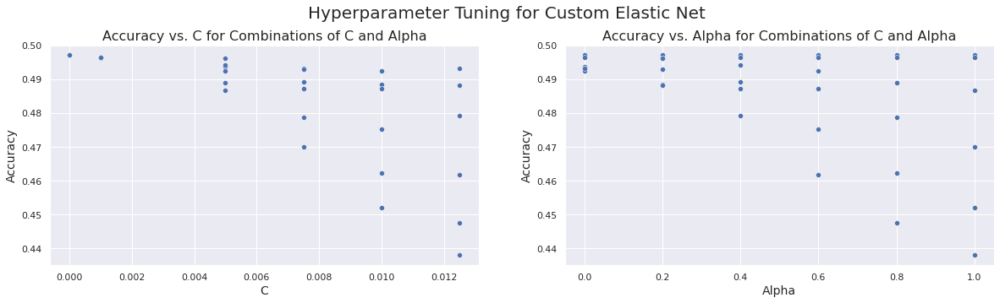

In [ ]:
# Visualize the tuning results
import seaborn as sns
ModelResults = pd.DataFrame(zip(alphas_and_Cs[:,0], alphas_and_Cs[:,1], accuracies_custom_en), columns = ['Alpha', 'C', 'Accuracy'])

# Adapted from Dr. Eric Larson's Data Visualization notebook:
# https://github.com/eclarson/MachineLearningNotebooks/blob/master/03.%20DataVisualization.ipynb
sns.set_theme()
fig=plt.figure(figsize=(20,5))
ax1 = plt.subplot(1,2,1)
ax2 = plt.subplot(1,2,2)

sns.scatterplot(data=ModelResults, x='C', y='Accuracy', ax = ax1)
ax1.set_xlabel("C", fontsize=14)
ax1.set_ylabel("Accuracy", fontsize=14)
ax1.set_title("Accuracy vs. C for Combinations of C and Alpha", fontsize = 16)

sns.scatterplot(data=ModelResults, x='Alpha', y='Accuracy', ax = ax2)
ax2.set_xlabel("Alpha", fontsize=14)
ax2.set_ylabel("Accuracy", fontsize=14)
ax2.set_title("Accuracy vs. Alpha for Combinations of C and Alpha", fontsize = 16)

fig.suptitle('Hyperparameter Tuning for Custom Elastic Net', fontsize=20)
plt.subplots_adjust(top=0.85)

**Top 5 hyperparameter combinations**

Below are the top 5 hyperparameter combinations with the highest accuracies that resulted from the training and tuning process. 0 is the optimal value of C. This is reflected in the visualization of the hyperparameter tuning above. The models fit with a value of C = 0 all have an accuracy of 49.71%, with consistently decreasing accuracy as C increases, as evident in the plot above.

According to the plot above, all values of $\alpha$ perform similarly. There is not one value of $\alpha$ that is consistently performing better than the others. However, when $\alpha$ = 0, the model accuracies appear to vary less, indicating more consistent performance for $\alpha$ = 0.

Therefore, the optimal values of C and $\alpha$ for the custom implementation are 0 and 0. When $\alpha$ = 0, the optimal penalty is an L2 regularization.

In [ ]:
# Top 5 hyperparameter combinations
ModelResults.sort_values(by = "Accuracy", ascending=False).head()

,Alpha,C,Accuracy
0,0.0,0.0,0.497129
6,0.2,0.0,0.497129
30,1.0,0.0,0.497129
24,0.8,0.0,0.497129
12,0.4,0.0,0.497129


### **3.3 Sci-kit Learn: Training and Tuning**

The same approach as used in 3.2 will be used to tune the SkLearn Model. Here, the 'saga' solver is used because it is the only solver available that is compatible with the elastic net method. Note that C must be greater than 0 for this implementation, so the smallest value of C in the tuning grid is 0.001.


**Defining hyperparameter grid**

After the first round of tuning, the optimal value of C was either 1.0, with an accuracy of 64.25%.  For the second round of tuning, we will "zoom" in on a narrower range of C and test other values near 1.

In [ ]:
# Defining hyperparameter grid
alphas = np.asarray([0, 0.2, 0.4, 0.6, 0.8, 1])
Cs = np.asarray([0.001, 0.01, 0.1, 1, 10]) # first round of tuning
Cs = np.asarray([0.1, 0.6, 1, 1.5, 2]) # second round of tuning

alphas_and_Cs = cartesian_product(alphas, Cs)

**Training and Tuning**

In [ ]:
# Training and Tuning
%%time
accuracies_sklearn = []
for hyperparams in alphas_and_Cs:
    sklearn_regression = LogisticRegression(solver='saga',
                                            penalty="elasticnet",
                                            l1_ratio=hyperparams[0],
                                            C=hyperparams[1])
    sklearn_regression.fit(X_train_sample,y_train_sample)
    yhat = sklearn_regression.predict(X_test_sample)

    accuracies_sklearn.append(accuracy_score(y_test_sample,yhat))

CPU times: user 1min 5s, sys: 2.28 s, total: 1min 7s
Wall time: 1min 7s


**Visualize the tuning results**

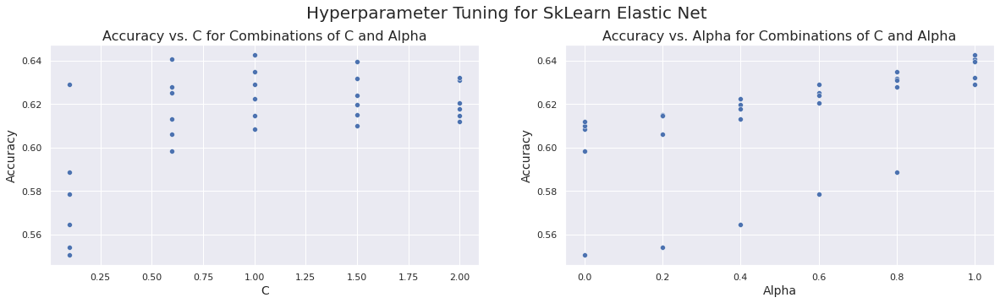

In [ ]:
# Visualize the tuning results
ModelResults_sklearn = pd.DataFrame(zip(alphas_and_Cs[:,0], alphas_and_Cs[:,1], accuracies_sklearn), columns = ['Alpha', 'C', 'Accuracy'])

# Adapted from Dr. Eric Larson's Data Visualization notebook:
# https://github.com/eclarson/MachineLearningNotebooks/blob/master/03.%20DataVisualization.ipynb
sns.set_theme()
fig=plt.figure(figsize=(20,5))

ax1 = plt.subplot(1,2,1)
ax2 = plt.subplot(1,2,2)

sns.scatterplot(data=ModelResults_sklearn, x='C', y='Accuracy', ax = ax1)
ax1.set_xlabel("C", fontsize=14)
ax1.set_ylabel("Accuracy", fontsize=14)
ax1.set_title("Accuracy vs. C for Combinations of C and Alpha", fontsize = 16)

sns.scatterplot(data=ModelResults_sklearn, x='Alpha', y='Accuracy', ax = ax2)
ax2.set_xlabel("Alpha", fontsize=14)
ax2.set_ylabel("Accuracy", fontsize=14)
ax2.set_title("Accuracy vs. Alpha for Combinations of C and Alpha", fontsize = 16)

fig.suptitle('Hyperparameter Tuning for SkLearn Elastic Net', fontsize=20)
plt.subplots_adjust(top=0.85)

**Top 5 hyperparameter combinations**

Below are the top 5 hyperparameter combinations with the highest accuracies that resulted from the training and tuning process. The optimal value of C is 1.0, which is also reflected in the visualization above. Values of C around 0.75 and 1.0 have higher accuracies than than the other values, meaning we have chosen a good range of C to find the optimal value.

The optimal value of $\alpha$ is 1.0. An $\alpha$ value of 1.0 corresponds to a L1 penalty. According to the plots above, the accuracies of all the models increase as $\alpha$ increases, indicating that larger values of $\alpha$ are consistently performing better, regardless of the value of C.

The accuracy of the model fit with the optimal parameters is of 64.25%

In [ ]:
# Top 5 hyperparameter combinations
ModelResults_sklearn.sort_values(by = "Accuracy", ascending=False).head()

,Alpha,C,Accuracy
27,1.0,1.0,0.642484
26,1.0,0.6,0.640658
28,1.0,1.5,0.639614
22,0.8,1.0,0.634916
29,1.0,2.0,0.632046


###**3.4 Compare Performance of Best Optimization between Custom Classifier and SkLearn**

Here, the custom classifier and the SkLearn logistic regressions are re-fit using the optimal combinations of tuning parameters.

This section also includes a series of histograms that illustrate the distribution of the predicted probability of the correct class faceted by the true class. These plots will give us an idea of how well the model is detecting and identifying each class. Ideally, the predicted probabilities will be left skewed for all classes, indicating that the model has mostly predicted high probabilities of each observation belonging to the correct class.

Be comparing a series of histgrams for each model we will be able to assess the performance of both implementations.

In [ ]:
# Refit Custom Classifier with the best combination of tuning parameters
best_combo_custom = alphas_and_Cs[np.min(np.where(np.max(accuracies_custom_en) == accuracies_custom_en))]

steepest_ascent_regression = MultiClassLogisticRegression(0.1,
                                                              'steepest_ascent',
                                                              'elastic_net',
                                                              best_combo_custom[1],
                                                              best_combo_custom[0],
                                                              500)
steepest_ascent_regression.fit(X_train_sample,y_train_sample)
yhat = steepest_ascent_regression.predict(X_test_sample)
yhat_probs_custom_en = steepest_ascent_regression.predict_proba(X_test_sample)

**Custom Model: Visualize distribution of predicted probabilities faceted by true class**

The custom classifier has fair ability to detect the true class of the observations. The custom model performs best at detecting observations that belong to classes 4 and 7. Class 4 has an approximately bimodel distribtuion of predicted probabilities, with a mild left skew tailing away from the lower mode centered at 0.22 and then a symmatric distribution centered around the mode at 0.24. Class 7 has a similarly shaped distribution with modes just above 0.18 and about 0.195.

The model likely has the greatest difficulty detecting observations that belong to classes 1 and 5, due to the fact that all of the observations have predicted probabilities for the correct class below 0.18, and neither distribution is left skewed.

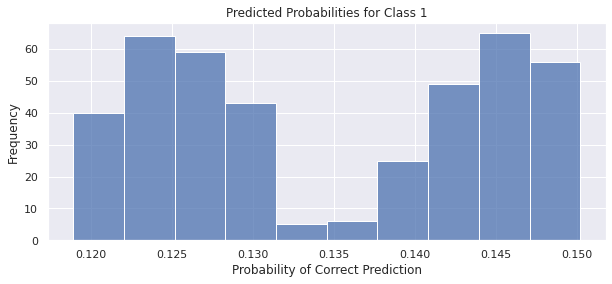

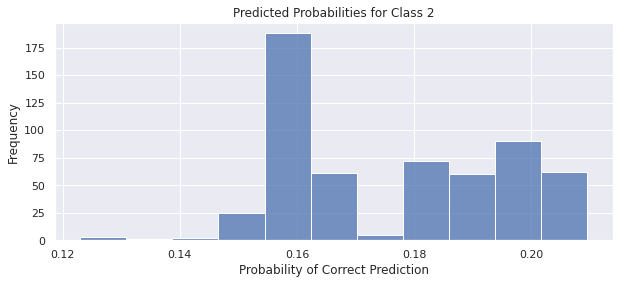

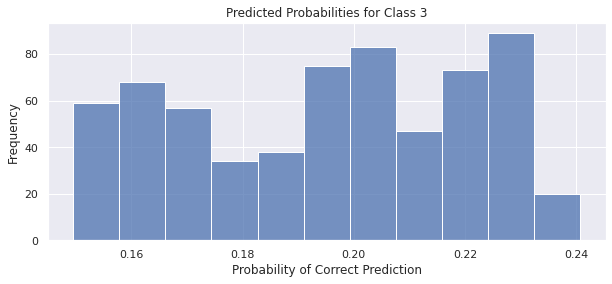

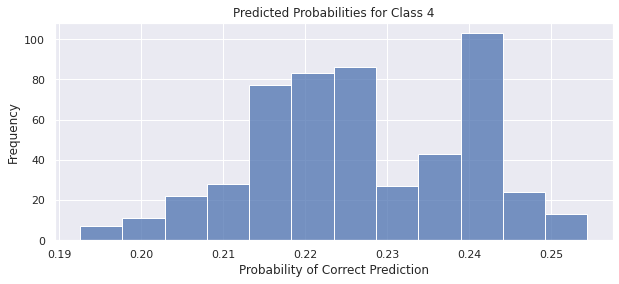

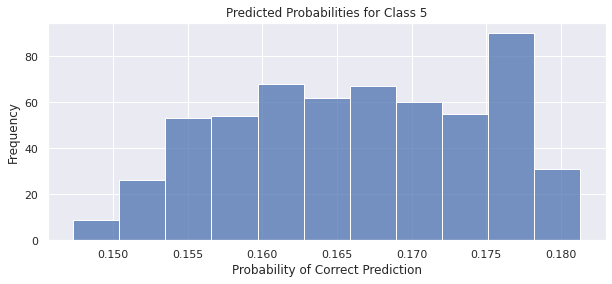

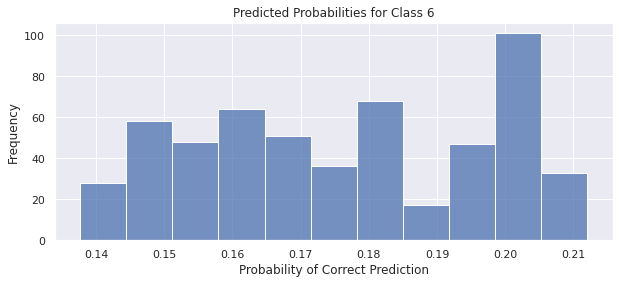

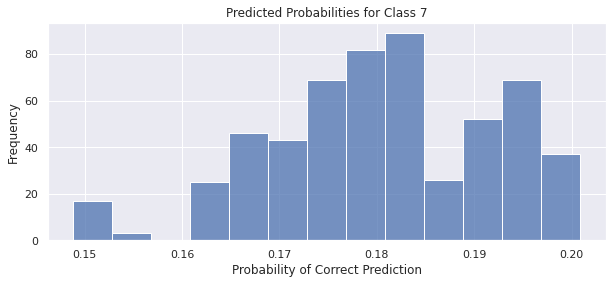

In [ ]:
# Visualize distribution of predicted probabilities faceted by true class
yhat_probs_custom_en_df = pd.DataFrame(yhat_probs_custom_en, columns=['1','2','3','4','5','6','7'])

for i in range(1,8):
    plt.figure(figsize=(10,4))
    sns.histplot(data=yhat_probs_custom_en_df.iloc[np.where(y_test_sample == i)], x=str(i))
    plt.title('Predicted Probabilities for Class ' + str(i))
    plt.xlabel('Probability of Correct Prediction')
    plt.ylabel('Frequency')

**Refit SkLearn with the best combination of tuning parameters**

In [ ]:
# Refit SkLearn with the best combination of tuning parameters
best_combo_sklearn = alphas_and_Cs[np.min(np.where(np.max(accuracies_sklearn) == accuracies_sklearn))]

sklearn_regression = LogisticRegression(solver='saga',
                                            penalty="elasticnet",
                                            l1_ratio=best_combo_sklearn[0],
                                            C=best_combo_sklearn[1])
sklearn_regression.fit(X_train_sample,y_train_sample)
yhat = sklearn_regression.predict(X_test_sample)
yhat_probs_sklearn = sklearn_regression.predict_proba(X_test_sample)

**SkLearn Model: Visualize distribution of predicted probabilities faceted by true class**

The SkLearn Classifier possesses a better ability to detect the true class of the observations than the custom classifier. The SkLearn model performs best at detecting observations that belong to classes 4 and 7, similar to the custom classifier, as evident by the strong left skews for both categories. The SkLearn classifier also produces a left skewed distribution of predicted probabilities for observations in class 5, although there is a peak at 0, indicating that some observations in class 5 are difficult to detect.

The SkLearn model appears to have the greatest difficulty detecting observations in class 2, as indicated by the cluster of predicted probabilities between 0 and 0.4.

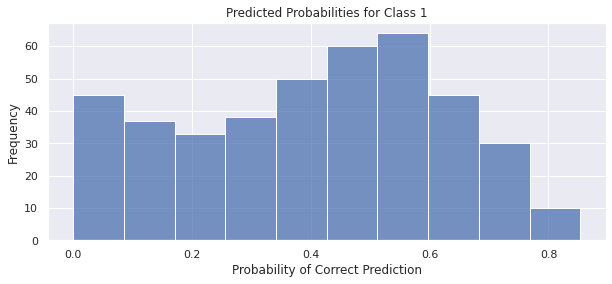

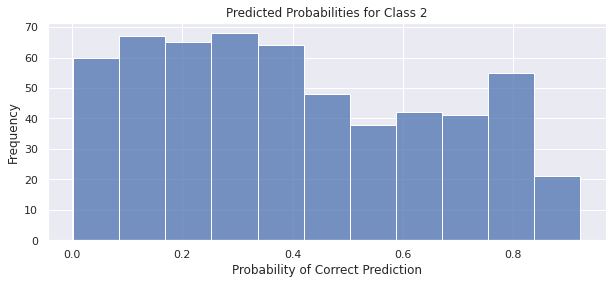

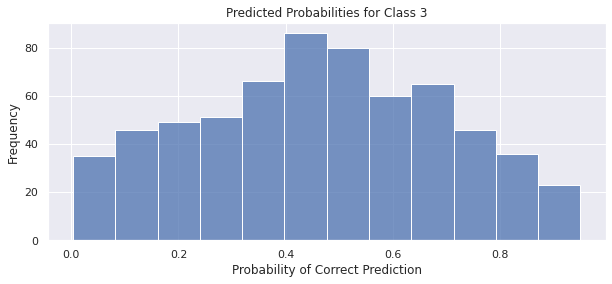

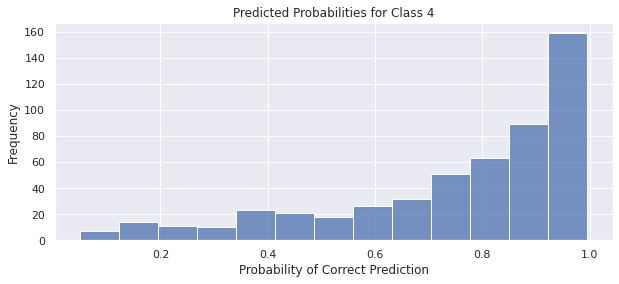

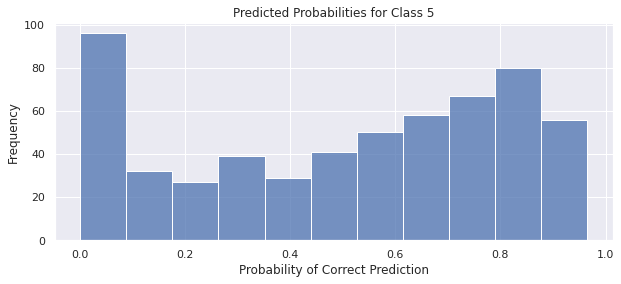

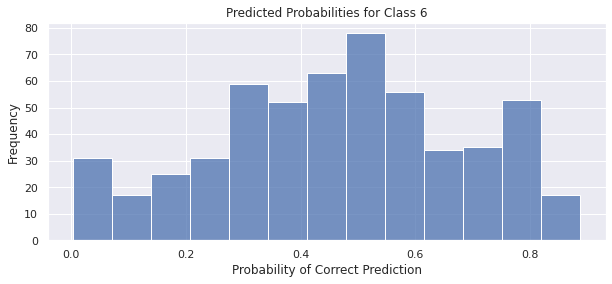

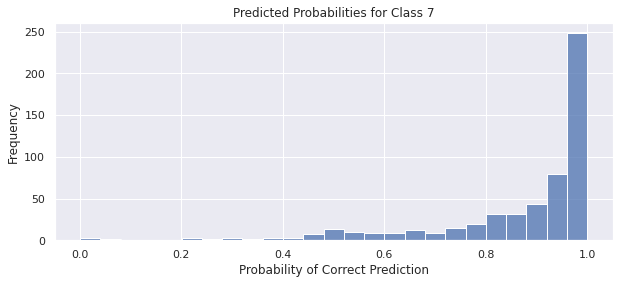

In [ ]:
# Visualize distribution of predicted probabilities faceted by true class
yhat_probs_sklearn_df = pd.DataFrame(yhat_probs_sklearn, columns=['1','2','3','4','5','6','7'])

for i in range(1,8):
    plt.figure(figsize=(10,4))
    sns.histplot(data=yhat_probs_sklearn_df.iloc[np.where(y_test_sample == i)], x=str(i))
    plt.title('Predicted Probabilities for Class ' + str(i))
    plt.xlabel('Probability of Correct Prediction')
    plt.ylabel('Frequency')

##**4. Deployment**

Which implementation of logistic regression would you advise be used in a deployed machine learning model, your implementation or scikit-learn (or other third party)? Why?

We would advise that the SkLearn implementation be used in a deployed machine learning model because it has the greater accuracy on the optimal tuning parameters (64.25% > 49.71%). Additionally, the SkLearn model is better at detecting observations in their true class with greater confidence, because the distributions of predicted probabilities for the correct classes reach higher ranges (at times near 0.8 or 1.0) and are more left skewed compared to the custom classifier, where no class was correctly predicted with a probability higher than 0.25.

Additionally, the SkLearn Implementation was computationally faster, with Wall Times of 57.2s and 1min 7s for the first and second tuning rounds respectively. On the other hand, the custom classifier had Wall Times of 3min 38s and 4min and 8s for the first and second tuning rounds respectively.

##**5. Exceptional Work**

###**5.1 : Feature Extraction using gabor Filter**


In [ ]:
from skimage.filters import gabor_kernel
from scipy import ndimage as ndi
from scipy import stats

In [ ]:
# prepare filter bank kernels
kernels = []
#shape = (height,width)
for theta in range(0,7,2):# orientations
    theta = theta / 7. * np.pi
    for sigma in (1, 3, 5): # std
        for frequency in (0.05, 0.20, 0.35): # frequency
            kernel = np.real(gabor_kernel(frequency, theta=theta,
                                          sigma_x=sigma, sigma_y=sigma))
            kernels.append(kernel)

# compute the filter bank and take statistics of image
# this can be drastically sped up using the 2D FFT
def compute_gabor(row):
    feats = np.zeros((len(kernels), 4), dtype=np.double)
    for k, kernel in enumerate(kernels):
        filtered = ndi.convolve(row.reshape(5,5), kernel, mode='wrap')
        _,_,feats[k,0],feats[k,1],feats[k,2],feats[k,3] = stats.describe(filtered.reshape(-1))
        # mean, var, skew, kurt

    return feats.reshape(-1)

idx_to_reconstruct = int(np.random.rand(1)*len(X_train_sample))

compute_gabor_vec = np.vectorize(compute_gabor,  signature='(n)->(m)')
gabr_feature = compute_gabor_vec(X_train_sample)
gabr_feature

array([[ 1.20376312e-01,  4.27104137e-03,  2.85831799e-01, ...,
         8.99855010e-08, -3.61208567e-04, -1.49667905e+00],
       [ 2.68632346e-01,  7.06102110e-03, -7.41767759e-02, ...,
         3.07016796e-07,  9.35293128e-05, -1.49894861e+00],
       [ 1.16874976e-01,  7.45987396e-03,  2.77636383e-01, ...,
         4.77147193e-08,  1.05254015e-03, -1.49316642e+00],
       ...,
       [ 8.87507651e-02,  7.46556222e-03,  2.37938474e-01, ...,
         4.11516375e-08, -5.20747147e-04, -1.47965900e+00],
       [ 2.09968733e-01,  1.09240886e-02,  2.87510405e-01, ...,
         2.42902807e-08, -4.07360390e-03, -1.45711637e+00],
       [ 2.16435719e-01,  1.63838001e-02,  3.40711593e-01, ...,
         1.31682760e-07, -2.51781174e-04, -1.49612228e+00]])

In [ ]:
# train test split
X_train, X_test, y_train, y_test = train_test_split(gabr_feature, y_train_sample)

In [ ]:
# Training and Tuning
%%time
accuracies_custom_en_gf = []
for hyperparams in alphas_and_Cs:
    steepest_ascent_regression = MultiClassLogisticRegression(0.1,
                                                              'steepest_ascent',
                                                              'elastic_net',
                                                              hyperparams[1],
                                                              hyperparams[0],
                                                              500)
    steepest_ascent_regression.fit(X_train,y_train)
    yhat = steepest_ascent_regression.predict(X_test)

    accuracies_custom_en.append(accuracy_score(y_test,yhat))

CPU times: user 30min 42s, sys: 18min 49s, total: 49min 32s
Wall time: 32min 51s


In [ ]:
ModelResults = pd.DataFrame(zip(alphas_and_Cs[:,0], alphas_and_Cs[:,1], accuracies_custom_en_gf), columns = ['Alpha', 'C', 'Accuracy'])
# Top 5 hyperparameter combination
ModelResults.sort_values(by = "Accuracy", ascending=False).head()

,Alpha,C,Accuracy
0,0.0,0.001,0.493866
10,0.2,0.001,0.493605
20,0.4,0.001,0.493083
30,0.6,0.001,0.491778
40,0.8,0.001,0.491517


With the kernel size 5 x 5, the features were created using gabor filter. We ran these generated features has X variables using the logistic model we created. We observed that the accuracy of the model dipped down by 10%. Hence we would not recommend using this method to extract features.

###**5.2 : implementing BFGS from Scratch**

___
### Rank Two Hessian Approximation: BFGS


Although the rank one approximation is a good performer, it can be improved by adding some additional criteria to the Hessian approximation. In this case, we assume that the $\mathbf{H}_k$ needs to also be positive semi-definite, which helps with numerical stability. One of the most popular quasi-Newton methods that does this is known as Broyden-Fletcher-Goldfarb-Shanno (BFGS).
- https://en.wikipedia.org/wiki/Broyden–Fletcher–Goldfarb–Shanno_algorithm

<img src="PDF_slides/bfgs_meme.png"  width="300">

#### Replace Step two with a higher rank approximation of the Hessian
In this formulation we add an additional vector matrix addition to the update equation that ensure the resulting matrix is positive semidefinite:
$$ \mathbf{H}_{k+1}=\mathbf{H}_k+\alpha_k\mathbf{u}_k\cdot\mathbf{u}_k^T + \beta_k\mathbf{z}_k\cdot\mathbf{z}_k^T$$

The derivation is intuitively similar to the previous rank one approximation. Again, there are many potential solutions, referred to as a family of ranke two solutions. However, it becomes easier to obtain simple solutions for $\mathbf{u}$ and $\mathbf{z}$. The BFGS solution takes the following form:
$$ \mathbf{u}_k = \mathbf{v}_k   \text{    and    } \mathbf{z}_k=\mathbf{H}_k \mathbf{s}_k  $$

After solving for the $\alpha_k$ and $\beta_k$ coefficients, we get the update equation as:
$$  \mathbf{H}_{k+1}=\mathbf{H}_k+\underbrace{\frac{\mathbf{v}_k \mathbf{v}_k^T}{\mathbf{v}_k^T \mathbf{s}_k}}_{\text{previous}} -\underbrace{\frac{\mathbf{H}_k \mathbf{s}_k \mathbf{s}_k^T \mathbf{H}_k}{\mathbf{s}_k^T \mathbf{H}_k \mathbf{s}_k}}_{\text{new}}  $$

The complete formulation can replace steps from the previous rank update as follows:

|Description| Equations, Derivations, Hessian Calculations, and Miscellaneous |
|-----------|--------|
| **Alternative Definitions with Rank 2 (BFGS)** |  |
| 6. Redefine approx Hessian| $$\mathbf{H}_{k+1}=\mathbf{H}_k+\frac{\mathbf{v}_k \mathbf{v}_k^T}{\mathbf{v}_k^T \mathbf{s}_k} -\frac{\mathbf{H}_k \mathbf{s}_k \mathbf{s}_k^T \mathbf{H}_k}{\mathbf{s}_k^T \mathbf{H}_k \mathbf{s}_k} $$ |
|7. Approximate Inverse $\mathbf{H}_{k+1}^{-1}$ via Sherman Morris| $$ \mathbf{H}_{k+1}^{-1} = \mathbf{H}_{k}^{-1} + \frac{(\mathbf{s}_k^T \mathbf{v}_k+\mathbf{H}_{k}^{-1})(\mathbf{s}_k \mathbf{s}_k^T)}{(\mathbf{s}_k^T \mathbf{v}_k)^2}-\frac{\mathbf{H}_{k}^{-1} \mathbf{v}_k \mathbf{s}_k^T+\mathbf{s}_k \mathbf{v}_k^T\mathbf{H}_{k}^{-1}}{\mathbf{s}_k^T \mathbf{v}_k} $$|

___
We won't explicitly program the BFGS algorithm--instead we can take advantage of scipy's calculations to do it for us. For using this algorithm, we need to define the objective function and the gradient explicitly for another program to calculate.
Recall that Logistic regression uses the following objective function:

$$ l(w) = \left(\sum_i y^{(i)} \ln g(\mathbf{x}^{(i)}) + (1-y^{(i)})\ln[1-g(\mathbf{x}^{(i)})]\right)  - C \cdot \sum_j w_j^2 $$

In [ ]:
from numpy import ma
def bfgs(f, x0, epsilon=1e-6, max_iter=1000):
    """
    Implementation of BFGS algorithm to find the minimum of a function.

    Parameters:
    f: function
        The function to minimize.
    x0: array-like
        The initial guess for the minimum.
    epsilon: float, optional
        The convergence threshold.
    max_iter: int, optional
        The maximum number of iterations to perform.

    Returns:
    x: array-like
        The minimum of the function.
    """
    # Initialize variables
    x = np.array(x0)
    n = len(x)
    I = np.eye(n)
    B = I
    g = np.gradient(f)
    k = 0

    while np.linalg.norm(g) > epsilon and k < max_iter:
        # Calculate search direction
        d = -np.dot(B, g)

        # Calculate step size using line search
        alpha = 1
        while f(x + alpha * d) > f(x) + 0.5 * alpha * np.dot(g, d):
            alpha *= 0.5

        # Update x
        x_new = x + alpha * d

        # Calculate gradient at new x
        g_new = np.gradient(f(x_new))

        # Calculate difference in gradients and x values
        delta_g = g_new - g
        delta_x = x_new - x

        # Update B
        B = np.dot(np.dot((I - np.outer(delta_x, delta_g) / np.dot(delta_x, delta_g)), B),
                   (I - np.outer(delta_g, delta_x) / np.dot(delta_x, delta_g))) + \
            np.outer(delta_x, delta_x) / np.dot(delta_x, delta_g)

        # Update variables
        x = x_new
        g = g_new
        k += 1

    return x

In [ ]:
%%time
# for this, we won't perform our own BFGS implementation
# (it takes a fair amount of code and understanding, which we haven't setup yet)
# luckily for us, scipy has its own BFGS implementation:

class BFGSBinaryLogisticRegression(BinaryLogisticRegression):

    @staticmethod
    def objective_function(w,X,y,C):
        g = expit(X @ w)
        # invert this because scipy minimizes, but we derived all formulas for maximzing
        return -np.sum(ma.log(g[y==1]))-np.sum(ma.log(1-g[y==0])) + C*sum(w**2)
        #-np.sum(y*np.log(g)+(1-y)*np.log(1-g))

    @staticmethod
    def objective_gradient(w,X,y,C):
        g = expit(X @ w)
        ydiff = y-g # get y difference
        gradient = np.mean(X * ydiff[:,np.newaxis], axis=0)
        gradient = gradient.reshape(w.shape)
        gradient[1:] += -2 * w[1:] * C
        return -gradient

    # just overwrite fit function
    def fit(self, X, y):
        Xb = self._add_bias(X) # add bias term
        num_samples, num_features = Xb.shape

        self.w_ = bfgs(self.objective_function, # what to optimize
                            np.zeros((num_features,1)), # starting point
                            max_iter=self.iters, # stopping criteria iterations
                            )

        self.w_ = self.w_.reshape((num_features,1))

bfgslr = BFGSBinaryLogisticRegression(_,iterations=2,C=0.001) # note that we need only a few iterations here

bfgslr.fit(X_train_sample,y_train_sample)
Bfgs_Feature = bfgslr.predict(X_test_sample)

CPU times: user 2.24 ms, sys: 645 µs, total: 2.89 ms
Wall time: 2.74 ms


In [ ]:
# train test split
X_train, X_test, y_train, y_test = train_test_split(Bfgs_Feature, y_test_sample)

In [ ]:
# Training and Tuning
%%time
accuracies_custom_en_gf = []
for hyperparams in alphas_and_Cs:
    steepest_ascent_regression = MultiClassLogisticRegression(0.1,
                                                              'steepest_ascent',
                                                              'elastic_net',
                                                              hyperparams[1],
                                                              hyperparams[0],
                                                              500)
    steepest_ascent_regression.fit(X_train_sample,y_train_sample)
    yhat = steepest_ascent_regression.predict(X_test_sample)

    accuracies_custom_en_gf.append(accuracy_score(y_test_sample,yhat))

CPU times: user 2min 16s, sys: 1min 42s, total: 3min 58s
Wall time: 2min 31s


In [ ]:
ModelResults = pd.DataFrame(zip(alphas_and_Cs[:,0], alphas_and_Cs[:,1], accuracies_custom_en_gf), columns = ['Alpha', 'C', 'Accuracy'])
# Top 5 hyperparameter combination
ModelResults.sort_values(by = "Accuracy", ascending=False).head()

,Alpha,C,Accuracy
0,0.0,0.015,0.470251
1,0.0,0.025,0.463987
4,0.2,0.015,0.462422
2,0.0,0.035,0.456681
8,0.4,0.015,0.456420


###**Implementing BFGS Using Scikit Built In Module**

In [ ]:
%%time
# for this, we won't perform our own BFGS implementation
# (it takes a fair amount of code and understanding, which we haven't setup yet)
# luckily for us, scipy has its own BFGS implementation:
from scipy.optimize import fmin_bfgs # maybe the most common bfgs algorithm in the world
from numpy import ma
class BFGSBinaryLogisticRegression(BinaryLogisticRegression):

    @staticmethod
    def objective_function(w,X,y,C):
        g = expit(X @ w)
        # invert this because scipy minimizes, but we derived all formulas for maximzing
        return -np.sum(ma.log(g[y==1]))-np.sum(ma.log(1-g[y==0])) + C*sum(w**2)
        #-np.sum(y*np.log(g)+(1-y)*np.log(1-g))

    @staticmethod
    def objective_gradient(w,X,y,C):
        g = expit(X @ w)
        ydiff = y-g # get y difference
        gradient = np.mean(X * ydiff[:,np.newaxis], axis=0)
        gradient = gradient.reshape(w.shape)
        gradient[1:] += -2 * w[1:] * C
        return -gradient

    # just overwrite fit function
    def fit(self, X, y):
        Xb = self._add_bias(X) # add bias term
        num_samples, num_features = Xb.shape

        self.w_ = fmin_bfgs(self.objective_function, # what to optimize
                            np.zeros((num_features,1)), # starting point
                            fprime=self.objective_gradient, # gradient function
                            args=(Xb,y,self.C), # extra args for gradient and objective function
                            gtol=1e-03, # stopping criteria for gradient, |v_k|
                            maxiter=self.iters, # stopping criteria iterations
                            disp=False)

        self.w_ = self.w_.reshape((num_features,1))

bfgslr = BFGSBinaryLogisticRegression(_,iterations=2,C=0.001) # note that we need only a few iterations here

bfgslr.fit(X_train_sample,y_train_sample)
bfgs_sc = bfgslr.predict(X_test_sample)

CPU times: user 369 ms, sys: 294 ms, total: 663 ms
Wall time: 389 ms


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(bfgs_sc, y_test_sample)

In [ ]:
# Training and Tuning
%%time
accuracies_custom_en_gf = []
for hyperparams in alphas_and_Cs:
    steepest_ascent_regression = MultiClassLogisticRegression(0.1,
                                                              'steepest_ascent',
                                                              'elastic_net',
                                                              hyperparams[1],
                                                              hyperparams[0],
                                                              500)
    steepest_ascent_regression.fit(X_train_sample,y_train_sample)
    yhat = steepest_ascent_regression.predict(X_test_sample)

    accuracies_custom_en_gf.append(accuracy_score(y_test_sample,yhat))

CPU times: user 2min 16s, sys: 1min 40s, total: 3min 57s
Wall time: 2min 32s


In [ ]:
ModelResults = pd.DataFrame(zip(alphas_and_Cs[:,0], alphas_and_Cs[:,1], accuracies_custom_en_gf), columns = ['Alpha', 'C', 'Accuracy'])
# Top 5 hyperparameter combination
ModelResults.sort_values(by = "Accuracy", ascending=False).head()

,Alpha,C,Accuracy
0,0.0,0.015,0.470251
1,0.0,0.025,0.463987
4,0.2,0.015,0.462422
2,0.0,0.035,0.456681
8,0.4,0.015,0.456420


We can see that the accuracy that we are getting from out custom model and the scikit model is almost the same. Therfore we can recommend our model for implementation.

##**Resources**
[80/20 Split Rule] https://stackoverflow.com/questions/13610074/is-there-a-rule-of-thumb-for-how-to-divide-a-dataset-into-training-and-validation

[Pareto Principle] https://towardsdatascience.com/finally-why-we-use-an-80-20-split-for-training-and-test-data-plus-an-alternative-method-oh-yes-edc77e96295d